# **Rice Leaf Disease Detection**

# **Dataset:**  - Rice Leafs 5 diseases

Kaggle Link: https://www.kaggle.com/datasets/adefiqri12/riceleafsv3/data

## 1. Imports and Mounting Google Drive


In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
import os
import pandas as pd
import matplotlib.pyplot as plt
import cv2
from tensorflow.keras.utils import to_categorical
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Conv2D, MaxPool2D, Flatten
from traitlets import validate
import sklearn.model_selection
import numpy as np
import tensorflow as tf
import sklearn.metrics
from sklearn.metrics import confusion_matrix
from sklearn.metrics import classification_report
from tensorflow.keras import regularizers
from tensorflow.keras import layers, models
from tensorflow.keras.utils import to_categorical
from tensorflow.keras.preprocessing.image import ImageDataGenerator

## 2. Data Preprocessing using ImageDataGenerator

In [ ]:
train_dir = '/content/drive/MyDrive/Class/Project_3/RiceLeafsv3/train'
validation_dir = '/content/drive/MyDrive/Class/Project_3/RiceLeafsv3/validation'
os.makedirs(validation_dir, exist_ok=True)

train_datagen = ImageDataGenerator(
    rescale=1./255,
    validation_split=0.2
)

target_size = (224,224)
batch_size = 32

train_generator = train_datagen.flow_from_directory(
    train_dir,
    target_size=target_size,
    batch_size=batch_size,
    class_mode='categorical',
    shuffle=True,
    subset='training'
)

validation_generator = train_datagen.flow_from_directory(
    train_dir,
    target_size=target_size,
    batch_size=batch_size,
    class_mode='categorical',
    shuffle=False,
    subset='validation'
)

Found 1716 images belonging to 6 classes.
Found 425 images belonging to 6 classes.


In [ ]:
train_class_names = list(train_generator.class_indices.keys())
validation_class_names = list(validation_generator.class_indices.keys())

print("Train Class Names:", train_class_names)
print("Validation Class Names:", validation_class_names)

Train Class Names: ['bacterial_leaf_blight', 'brown_spot', 'healthy', 'leaf_blast', 'leaf_scald', 'narrow_brown_spot']
Validation Class Names: ['bacterial_leaf_blight', 'brown_spot', 'healthy', 'leaf_blast', 'leaf_scald', 'narrow_brown_spot']


##3. Loading and Displaying Sample Images


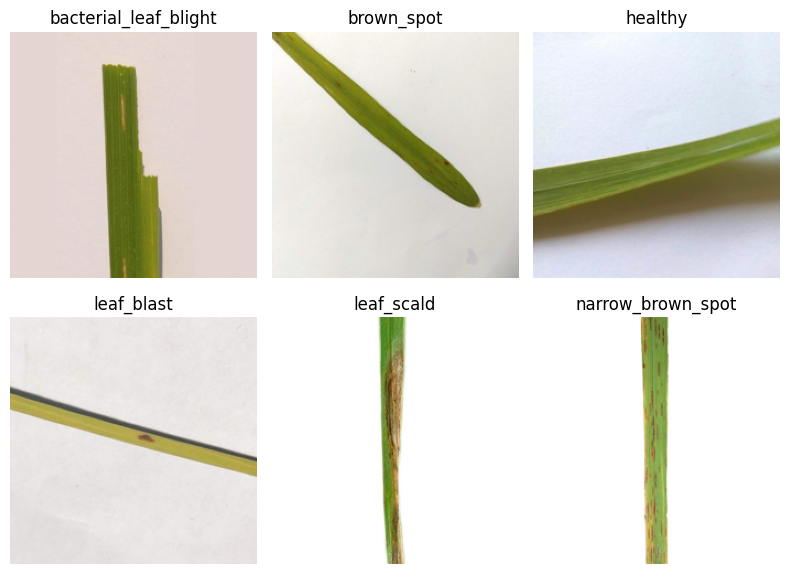

In [ ]:
from PIL import Image
def load_image(image_path, class_names):
    img = Image.open(image_path)
    img = img.resize((224, 224))
    img = img.convert('RGB')
    img = np.array(img) / 255.0

    class_name = os.path.basename(os.path.dirname(image_path))
    class_index = class_names.index(class_name)

    return img, class_index

fig, axes = plt.subplots(2, 3, figsize=(8, 6))

for i, subfolder in enumerate(train_class_names):
    class_dir = os.path.join(train_dir, subfolder)
    class_images = os.listdir(class_dir)

    sample_image_path = os.path.join(class_dir, class_images[0])
    sample_image, class_index = load_image(sample_image_path, train_class_names)

    row_index = i // 3
    col_index = i % 3
    axes[row_index, col_index].imshow(sample_image)
    axes[row_index, col_index].set_title(train_class_names[class_index])
    axes[row_index, col_index].axis('off')

plt.tight_layout()
plt.show()


## 4. Model

### Why Choose Vision Transformer (ViT)?

* Vision Transformers have shown remarkable performance in various computer vision tasks, including image classification, object detection, and segmentation.

* Unlike traditional convolutional neural networks (CNNs), ViTs operate purely on self-attention mechanisms, enabling them to capture global dependencies in the input data efficiently.

* ViTs can process images of arbitrary sizes, allowing for more flexibility in handling diverse datasets.

* They exhibit strong generalization capabilities and require fewer parameters compared to CNNs for similar performance.

Transformers, in general, offer state-of-the-art performance and scalability, making them an attractive choice for various machine learning applications, including computer vision.

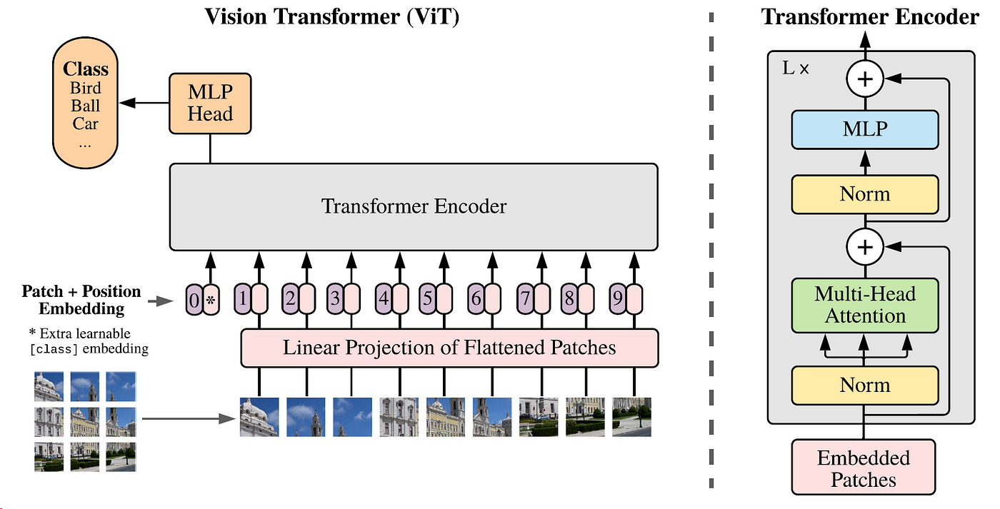

In [ ]:
import tensorflow as tf
from tensorflow.keras import layers, models
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping

def multi_head_self_attention(x, embed_dim, num_heads):
    head_dim = embed_dim // num_heads
    assert head_dim * num_heads == embed_dim, "Embedding dimension must be divisible by the number of heads."

    def scaled_dot_product_attention(q, k, v):
        matmul_qk = tf.matmul(q, k, transpose_b=True)
        dk = tf.cast(tf.shape(k)[-1], tf.float32)
        scaled_attention_logits = matmul_qk / tf.math.sqrt(dk)
        attention_weights = tf.nn.softmax(scaled_attention_logits, axis=-1)
        output = tf.matmul(attention_weights, v)
        return output, attention_weights

    q = layers.Dense(embed_dim)(x)
    k = layers.Dense(embed_dim)(x)
    v = layers.Dense(embed_dim)(x)

    q = tf.reshape(q, (-1, tf.shape(q)[1], num_heads, head_dim))
    k = tf.reshape(k, (-1, tf.shape(k)[1], num_heads, head_dim))
    v = tf.reshape(v, (-1, tf.shape(v)[1], num_heads, head_dim))

    q = tf.transpose(q, perm=[0, 2, 1, 3])
    k = tf.transpose(k, perm=[0, 2, 1, 3])
    v = tf.transpose(v, perm=[0, 2, 1, 3])

    attention, _ = scaled_dot_product_attention(q, k, v)

    attention = tf.transpose(attention, perm=[0, 2, 1, 3])
    attention = tf.reshape(attention, (-1, tf.shape(attention)[1], embed_dim))

    output = layers.Dense(embed_dim)(attention)

    return output

def vision_transformer(input_shape, num_classes, embed_dim=256, num_heads=8, ff_dim=2048, num_transformer_blocks=12, mlp_dim=512, dropout_rate=0.1, learning_rate=1e-4):
    inputs = layers.Input(shape=input_shape)

    patch_size = 16
    patches = layers.Conv2D(embed_dim, patch_size, strides=patch_size, padding="valid")(inputs)
    patches = layers.BatchNormalization()(patches)
    patches = layers.Activation("swish")(patches)
    patches = layers.Reshape((-1, embed_dim))(patches)

    positions = tf.range(start=0, limit=tf.shape(patches)[1], delta=1)
    positions = tf.expand_dims(positions, axis=-1)
    positions = tf.cast(positions, dtype=tf.float32)
    position_embeddings = positions + patches

    for _ in range(num_transformer_blocks):
        x1 = layers.LayerNormalization(epsilon=1e-6)(position_embeddings)
        x2 = multi_head_self_attention(x1, embed_dim, num_heads)
        x2 = layers.Dropout(dropout_rate)(x2)
        position_embeddings = x1 + x2

        x3 = layers.LayerNormalization(epsilon=1e-6)(position_embeddings)
        x3 = layers.Conv1D(filters=ff_dim, kernel_size=1, activation="swish")(x3)
        x3 = layers.Dropout(dropout_rate)(x3)
        x3 = layers.Conv1D(filters=embed_dim, kernel_size=1)(x3)
        position_embeddings = position_embeddings + x3

    x = layers.GlobalAveragePooling1D()(position_embeddings)
    x = layers.Dropout(0.1)(x)
    x = layers.Dense(mlp_dim, activation="swish")(x)
    x = layers.Dropout(0.1)(x)

    x = layers.Flatten()(x)

    outputs = layers.Dense(num_classes, activation="softmax")(x)

    model = models.Model(inputs=inputs, outputs=outputs)
    optimizer = Adam(learning_rate=learning_rate)
    model.compile(optimizer=optimizer, loss='categorical_crossentropy', metrics=['accuracy'])

    return model

## 5. Training the Vision Transformer Model

In [ ]:
input_shape = (224, 224, 3)
num_classes = 6

vit_model = vision_transformer(input_shape, num_classes, learning_rate=1e-4)

In [ ]:
early_stopping = EarlyStopping(monitor='val_loss', patience=3, restore_best_weights=True)
history = vit_model.fit(train_generator, epochs=200, validation_data=(validation_generator), callbacks=[early_stopping])

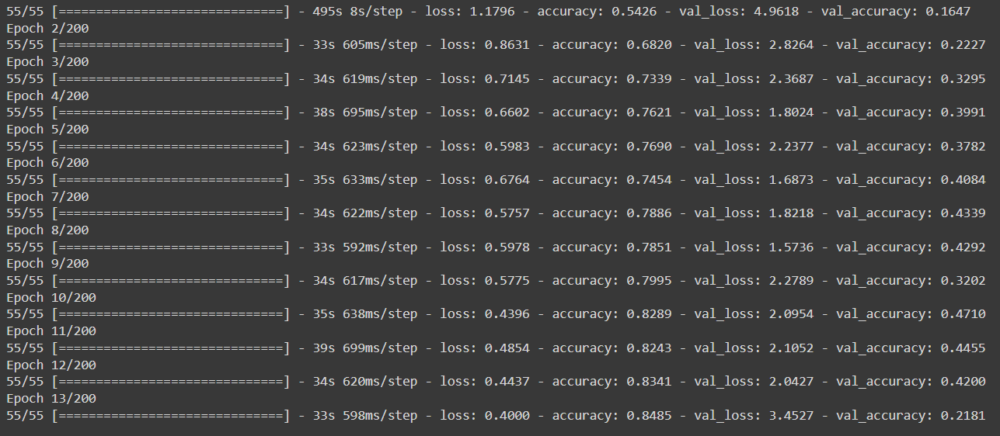

In [ ]:
model_save_path = '/content/drive/MyDrive/Class/Project_3/RiceLeafsv3/model_vit.h5'
vit_model.save(model_save_path)

print("Model saved at:", model_save_path)

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Model saved at: /content/drive/MyDrive/Class/Project_3/RiceLeafsv3/model_vit.h5


### New

1/1 [==============================] - 2s 2s/step


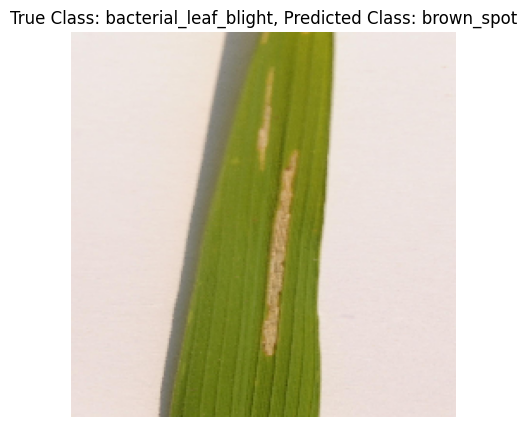

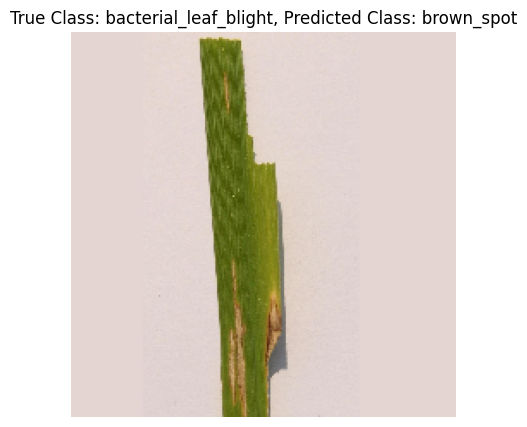

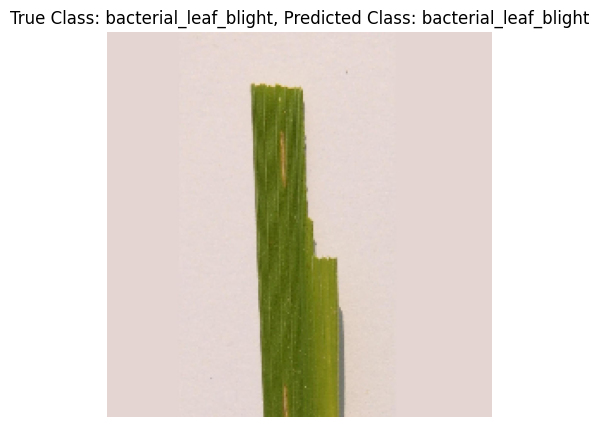

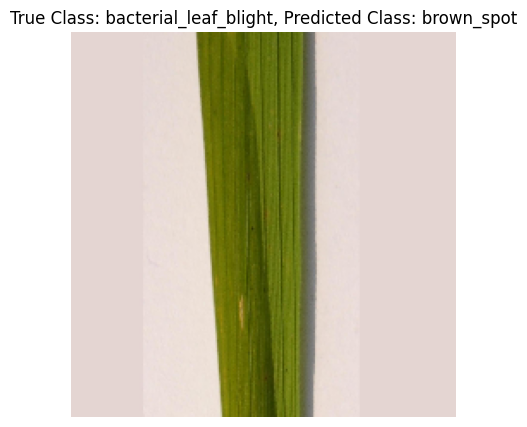

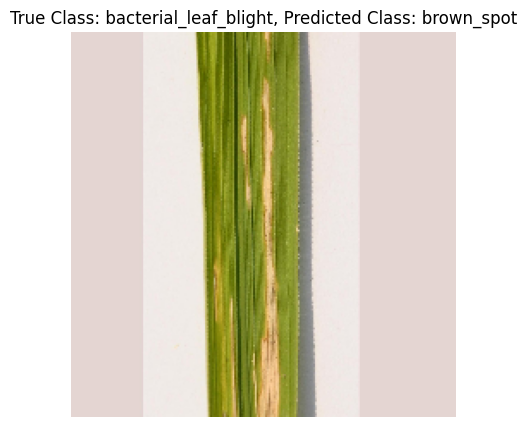

...

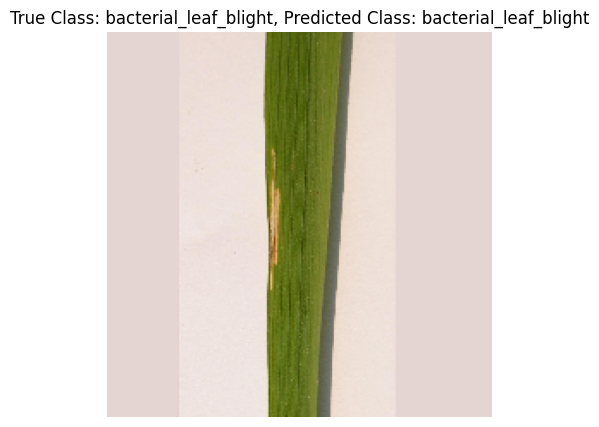

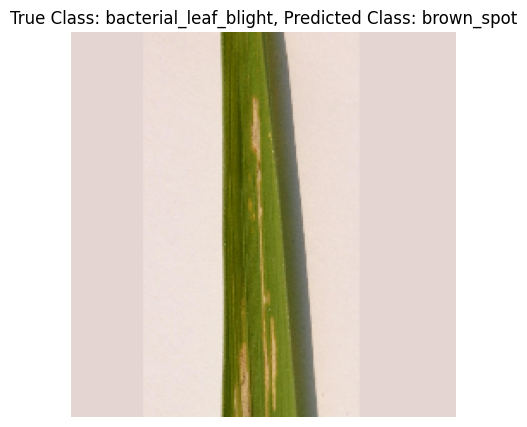

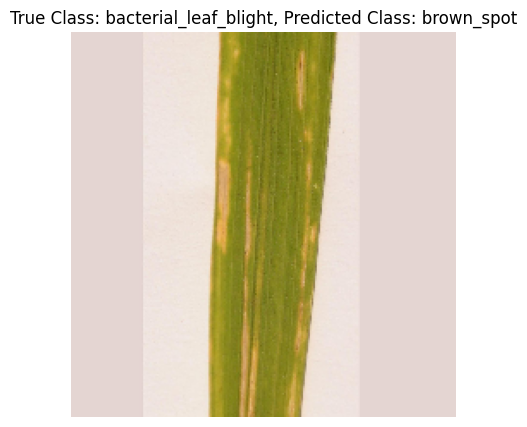

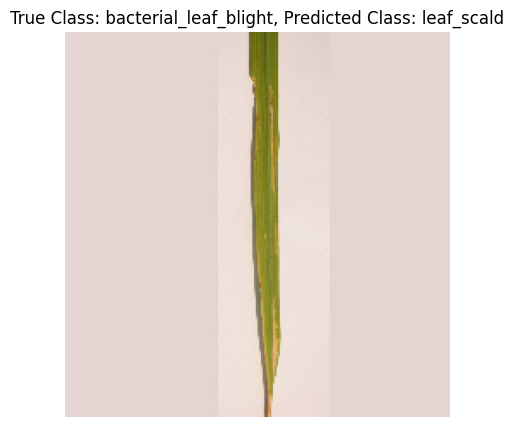

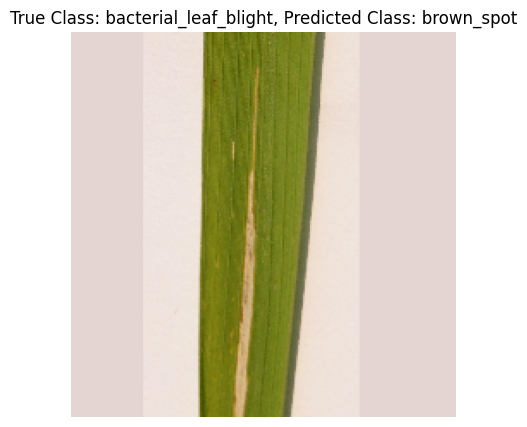

1/1 [==============================] - 0s 33ms/step


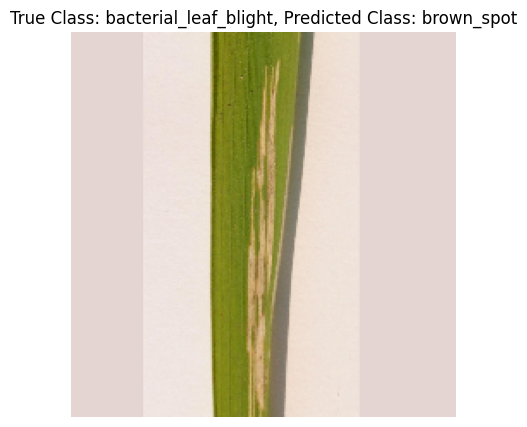

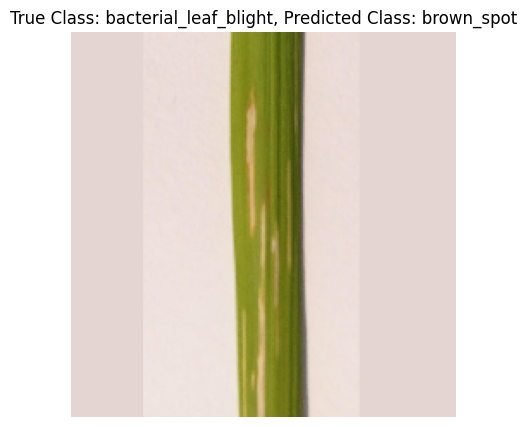

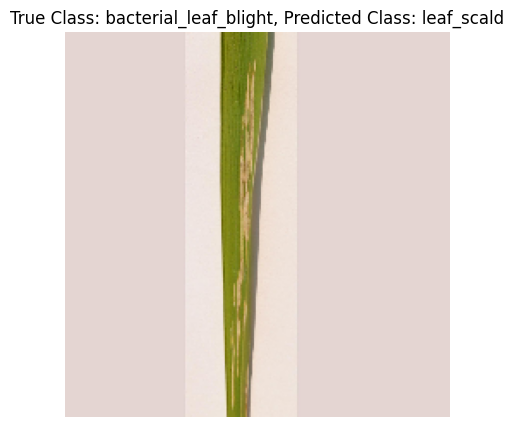

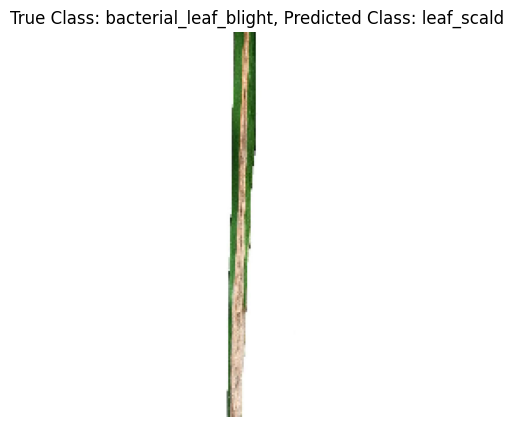

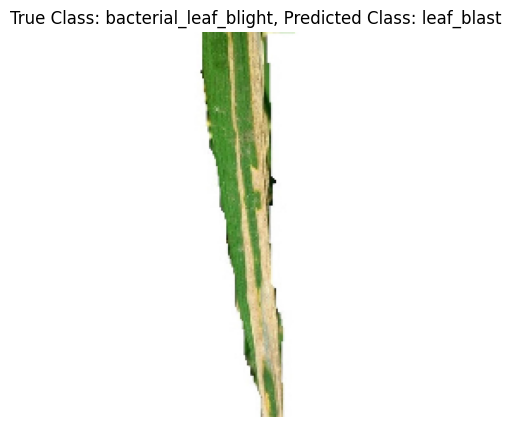

...

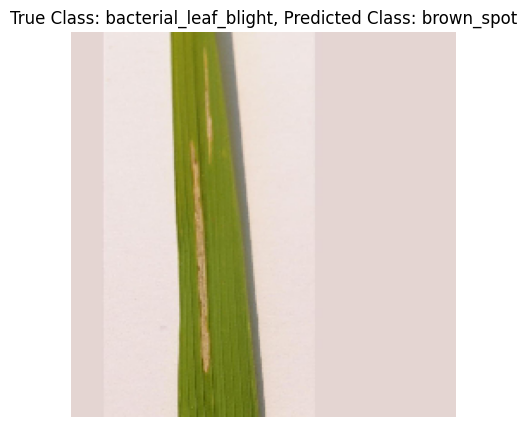

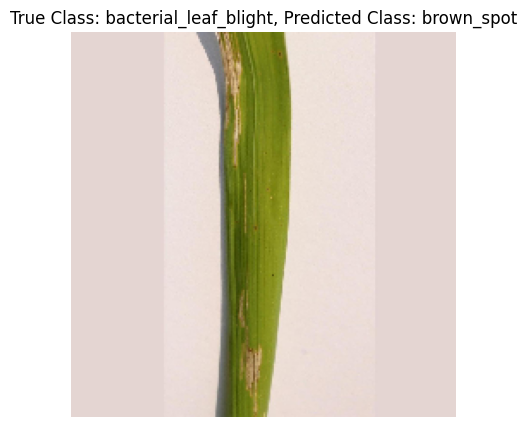

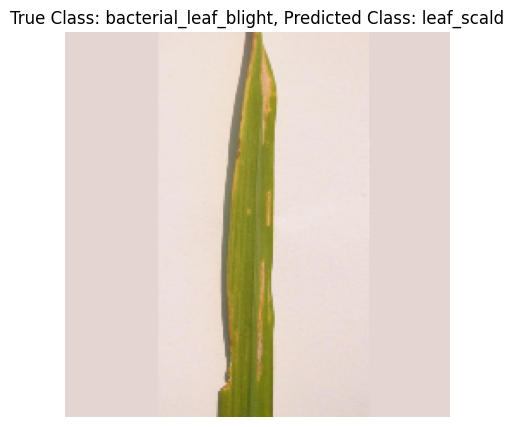

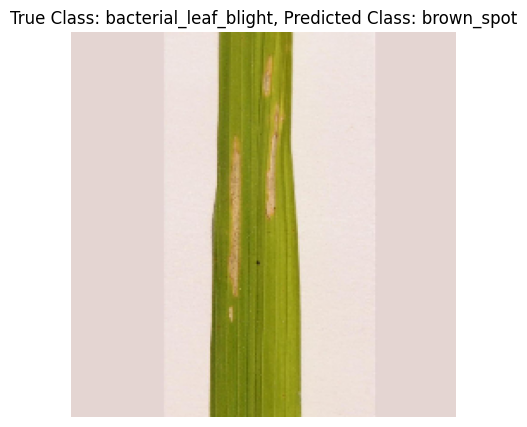

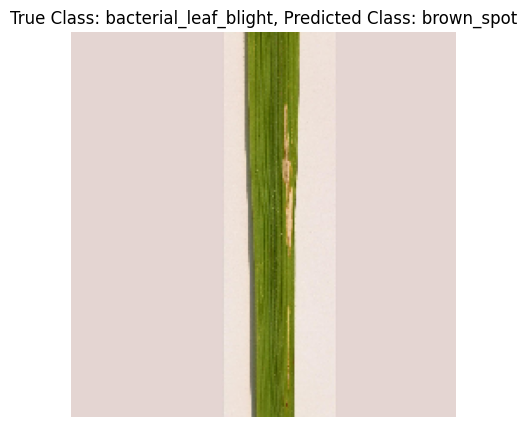

1/1 [==============================] - 0s 35ms/step


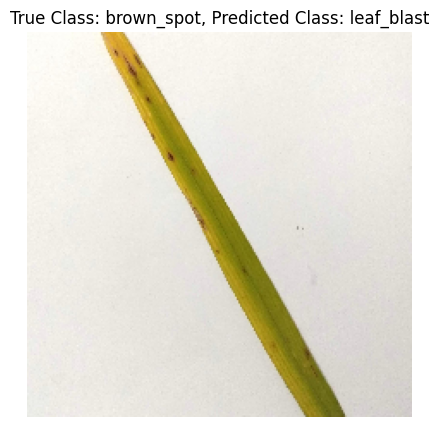

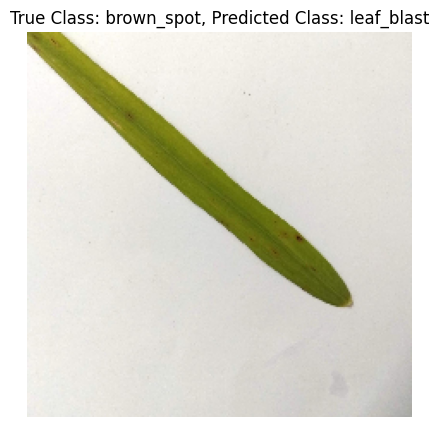

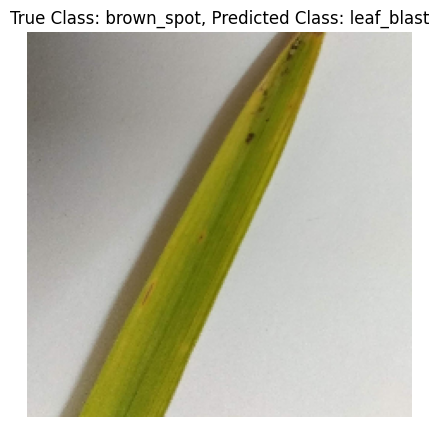

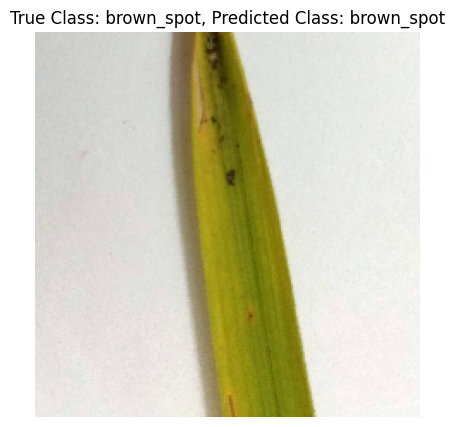

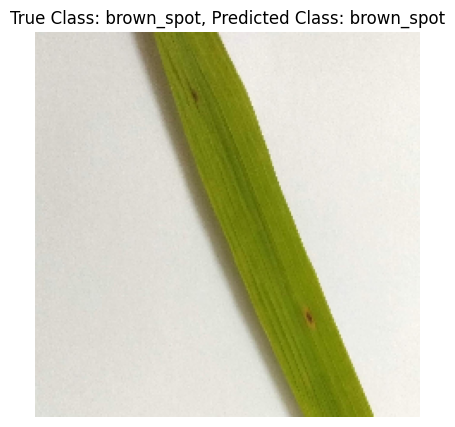

...

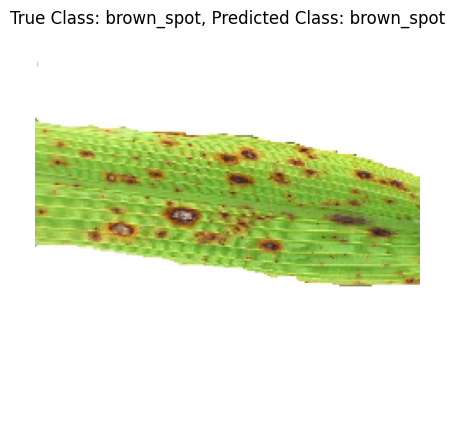

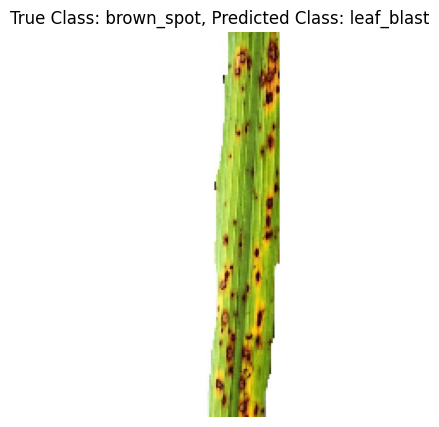

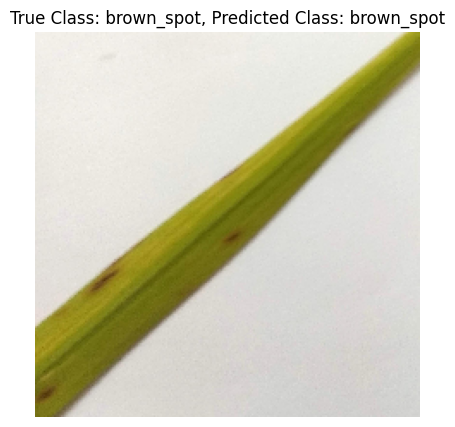

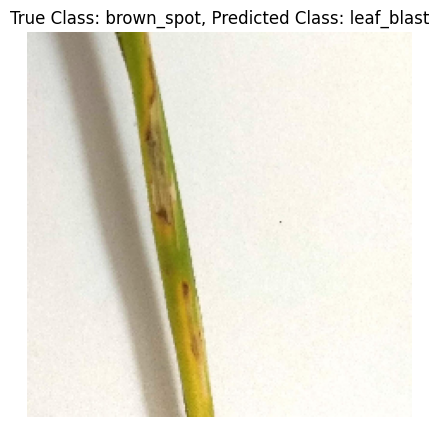

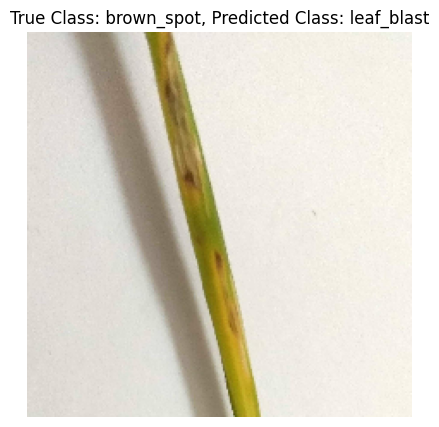

In [ ]:
def display_classified_images(generator, model):
    num_images = len(generator)
    class_names = list(generator.class_indices.keys())
    for i in range(num_images):
        batch_images, batch_labels = generator[i]
        batch_predictions = model.predict(batch_images)
        for j in range(len(batch_images)):
            predicted_class = np.argmax(batch_predictions[j])
            true_class_index = np.argmax(batch_labels[j])
            true_class = class_names[true_class_index]
            predicted_class_name = class_names[predicted_class]
            if (i * batch_size + j) % 12 == 0:
                fig, axes = plt.subplots(3, 4, figsize=(12, 10))
                fig.suptitle('Classified Images', fontsize=16)

            row_index = (i * batch_size + j) // 4 % 3
            col_index = (i * batch_size + j) % 4
            axes[row_index, col_index].imshow(batch_images[j])
            axes[row_index, col_index].set_title(f'True: {true_class}\nPredicted: {predicted_class_name}')
            axes[row_index, col_index].axis('off')
            if (i * batch_size + j + 1) % 12 == 0 or (i == num_images - 1 and j == len(batch_images) - 1):
                plt.tight_layout()
                plt.show()